In [1]:
using QuantumOptics, Plots, Parameters, ZChop, FFTW

## Let's try hydrogen in a B-field first

In [107]:
# bases
be = SpinBasis(1//2)
bp = SpinBasis(1//2)
b = be ⊗ bp

[Spin(1/2) ⊗ Spin(1/2)]

In [108]:
sx = sigmax(be)
sy = sigmay(be)
sz = sigmaz(be)
sp = sigmap(be)
sm = sigmam(be)


ωe = 0.;
ωp = 0.;
Ω = 1.0;
μe = 0.1;
μp = 0.001;
B = 1;

Hspin(ω, σ) = ω*σ/2

Ho = Hspin(ωe, sz)⊗one(bp) + one(be)⊗Hspin(ωp, sz)
Hint = Ω*(sx⊗sx + sy⊗sy + sz⊗sz)
HB = -(μe*sz⊗one(bp) + μp*one(be)⊗sz) * B  # assume B || z

H = Ho + Hint + HB

SparseOperator(dim=4x4)
  basis: [Spin(1/2) ⊗ Spin(1/2)]
  [1, 1]  =  0.899+0.0im
  [2, 2]  =  -0.901+0.0im
  [3, 2]  =  2.0+0.0im
  [2, 3]  =  2.0+0.0im
  [3, 3]  =  -1.099+0.0im
  [4, 4]  =  1.101+0.0im

In [109]:
ψod = 1/√2 * (spinup(be) + spindown(be) )⊗spindown(bp)
ψou = 1/√2 * (spinup(be) + spindown(be) )⊗spinup(bp)


T = [0:0.01:1000;]

tout, ψtd = timeevolution.schroedinger(T, ψod, H);
tout, ψtu = timeevolution.schroedinger(T, ψou, H);

In [410]:
exp_ed = real(expect(sx ⊗ one(bp), ψtd));
exp_pd = real(expect(one(be) ⊗ sx, ψtd));
exp_eu = real(expect(sx ⊗ one(bp), ψtu));
exp_pu = real(expect(one(be) ⊗ sx, ψtu));

exp_e = exp_eu + exp_ed;
exp_p = exp_pu + exp_pd;

In [411]:
display(plot(T, [exp_ed, exp_pd, exp_eu, exp_pu], labels = ["<sx>(e,dn)" "<sx>(p,dn)" "<sx>(e,up)" "<sx>(p,up)"]))
plot(T, [exp_e, exp_p], labels = ["<sx>(e)" "<sx>(p)"])

fmax = 100.0 | resolution df = 0.001


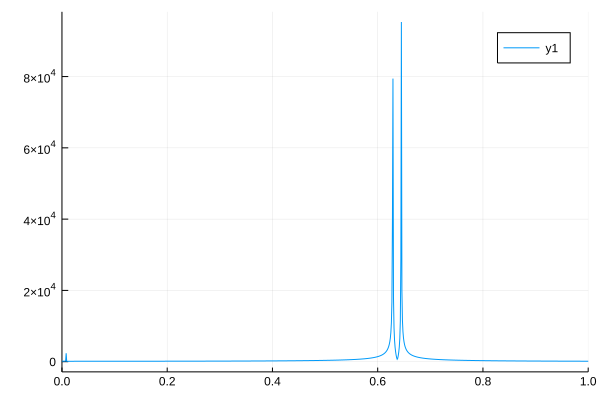

In [412]:
dt = T[2] - T[1]
dsx_e = [(exp_e[i+1] - exp_e[i])/dt for i in 1:length(T)-1];
#plot(T[1:end-1], dsx_e)

fmax = 1/dt
df = 1/(T[end] - T[1])
frng = LinRange(0, fmax, length(T)-1)
println("fmax = $fmax | resolution df = $df")
Fdsx_e = fft(dsx_e)
plot(frng, abs.(Fdsx_e))
xlims!((0,1))

In [110]:
res = []
for bf = 0:0.01:50
    global B = bf
    HB = -(μe*sz⊗one(bp) + μp*one(be)⊗sz) * B  # assume B || z
    H = Hspin(ωe, sz)⊗one(bp) + one(be)⊗Hspin(ωp, sz) + Hint + HB
    push!(res, prepend!(eigenenergies(dense(H)), bf))
end

In [111]:
Bfields = [res[i][1] for i in 1:length(res)]
E1 = [res[i][2] for i in 1:length(res)]
E2 = [res[i][3] for i in 1:length(res)]
E3 = [res[i][4] for i in 1:length(res)]
E4 = [res[i][5] for i in 1:length(res)];

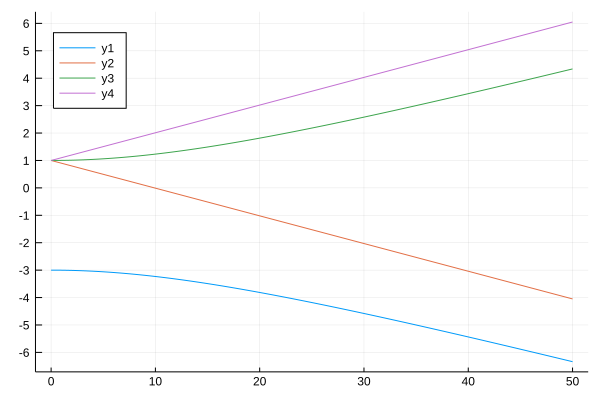

In [112]:
plot(Bfields, [E1, E2, E3, E4], legend = :topleft, yticks=-10:1.0:10)

## Now deuterium

In [60]:
# bases
be = SpinBasis(1//2)
bd = SpinBasis(1)
bD = be ⊗ bd

# spin-½ and spin-1 σ-matrices
sx = sigmax(be)
sy = sigmay(be)
sz = sigmaz(be)

sxd = sigmax(bd)
syd = sigmay(bd)
szd = sigmaz(bd)

# Some constants (this is still a numerical package)
ωe = 0.;
ωd = 0.;
A = 342.83; # this is A/ħ (in MHz) = ⅙ × 2π × f_HF, since ω_HF = 6 × A/ħ in deuterium, and f_HF = 327.38MHz
μe = 88093.0; # 10⁶ × μe/ħ  (electron magnetic moment divided by ħ | units: MHz/T)
μd = 0.0;  # get rid of nuclear magnetic moment to lighten calculations
B = 0.01;  # Magnetic field in Tesla

# Hamiltonian
Hspin(ω, σ) = ω*σ/2
HoD = Hspin(ωe, sz)⊗one(bd) + one(be)⊗Hspin(ωd, szd) # Rest energy Hamiltonian -- ignore (via ωe = ωd = 0)

HintD = A*(sx⊗sxd + sy⊗syd + sz⊗szd) # I⋅S interaction Hamiltonian

HBD = -(μe*sz⊗one(bd) + μd*one(be)⊗szd) * B  # Magnetic Hamiltonian -- assume B || z

HD = HoD + HintD + HBD  # Total Hamiltonian

# wavefunctions and density matrices for <s>e || x
ψp = 1/√2 * (spinup(be) + spindown(be))⊗spinup(bd) # |e:↑>ₓ⊗ |d:↑>ₓ
ψ0 = 1/√2 * (spinup(be) + spindown(be))⊗Ket(bd, [0,1,0])   # |e:↑>ₓ⊗ |d:0>ₓ
ψm = 1/√2 * (spinup(be) + spindown(be))⊗spindown(bd);   # |e:↑>ₓ⊗ |d:↓>ₓ

In [61]:
T = [0:0.001:100;]

tout, ψpt = timeevolution.schroedinger(T, ψp, HD);
tout, ψ0t = timeevolution.schroedinger(T, ψ0, HD);
tout, ψmt = timeevolution.schroedinger(T, ψm, HD);

In [62]:
Sxpt = real(expect(sx ⊗ one(bd), ψpt));
Sx0t = real(expect(sx ⊗ one(bd), ψ0t));
Sxmt = real(expect(sx ⊗ one(bd), ψmt));

dt = T[2] - T[1]
dSxpdt = [(Sxpt[i+1] - Sxpt[i])/dt for i in 1:length(T)-1];
dSx0dt = [(Sx0t[i+1] - Sx0t[i])/dt for i in 1:length(T)-1];
dSxmdt = [(Sxmt[i+1] - Sxmt[i])/dt for i in 1:length(T)-1];

#plot(T[1:100:end], [Sxpt[1:100:end], Sx0t[1:100:end], Sxmt[1:100:end]], labels = "<sx>e", legend = :bottomright)

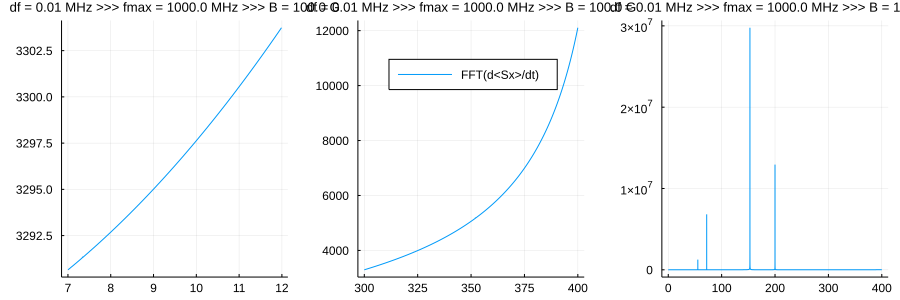

In [63]:
# Fourier
dt = T[2] - T[1]  # time increment
fmax = 1/dt       # max sampled frequency = 1/sampling rate (Note: FFT is mirrored beyond fmax/2)
df = 1/(T[end] - T[1])   # frequency increment = 1/(measurement time)
frng = LinRange(0, fmax, length(T)-1)  # available frequency range (-1 because of the derivative | see below)

# Time derivative of the Sx signal -- that's what the coil sees
dSxdt = dSxpdt + dSx0dt + dSxmdt;

# Fourier
FT_dSxdt = fft(dSxdt)

f_start = 7
f_step = 1
f_end = 12
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

plotlow = plot(f_part[:,1], f_part[:,2], legend = :false, titlefontsize = 9)


f_start = 300
f_step = 1
f_end = 400
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

plothi = plot(f_part[:,1], f_part[:,2], label = "FFT(d<Sx>/dt)", titlefontsize = 9)


f_start = 0
f_step = 1
f_end = 400
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

plotall = plot(f_part[:,1], f_part[:,2], legend = :false, titlefontsize = 9)

plot(plotlow, plothi, plotall, size = (900,300), title = "df = $df MHz >>> fmax = $fmax MHz >>> B = $(B*10000) G", layout = @layout [a b c])


In [104]:
res = []
for bf = 0:0.01:50
    global B = bf
    HBD = -(μe*sz⊗one(bd) + μd*one(be)⊗szd) * B  # assume B || z
    HD = HoD + HintD + HBD
    push!(res, prepend!(eigenenergies(dense(HD)), bf))
end

In [105]:
Bfields = [res[i][1] for i in 1:length(res)]
E1 = [res[i][2] for i in 1:length(res)]
E2 = [res[i][3] for i in 1:length(res)]
E3 = [res[i][4] for i in 1:length(res)]
E4 = [res[i][5] for i in 1:length(res)]
E5 = [res[i][6] for i in 1:length(res)]
E6 = [res[i][7] for i in 1:length(res)];

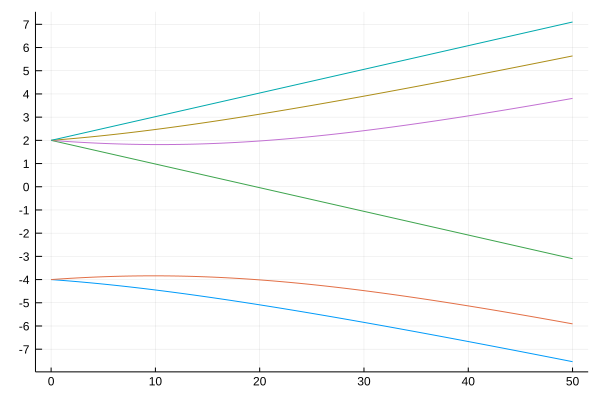

In [106]:
plot(Bfields, [E1, E2, E3, E4, E5, E6], legend = false, yticks=-10:1.0:10)

In [149]:
ψoD = spinup(be)⊗spindown(bd)

T = [0:0.01:10;]

tout, ψtD = timeevolution.schroedinger(T, ψoD, HD);

In [151]:
exp_eD = real(expect(sz ⊗ one(bd), ψtD));
exp_dD = real(expect(one(be) ⊗ szd, ψtD));

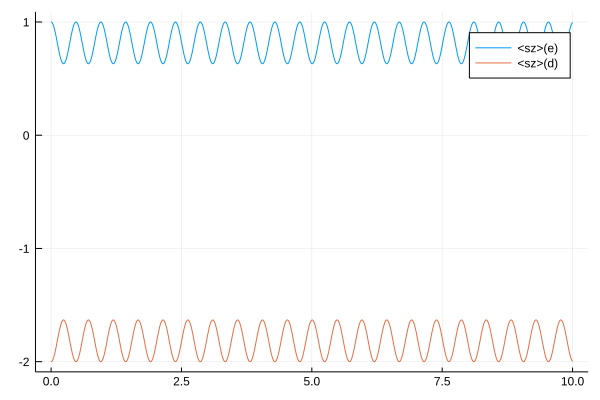

In [153]:
plot(T, [exp_eD, exp_dD], labels = ["<sz>(e)" "<sz>(d)"])

## A master equation for Hydrogen?

In [232]:
# bases
be = SpinBasis(1//2)
bp = SpinBasis(1//2)
b = be ⊗ bp

# spin-½ σ-matrices for e and p
sx = sigmax(be)
sy = sigmay(be)
sz = sigmaz(be)

sxp = sigmax(bp)
syp = sigmay(bp)
szp = sigmaz(bp)

# Some constants (this is still a numerical package)
ωe = 0.;
ωp = 0.;
A = 2231.17; # this is A/ħ (in MHz) = ¼ × 2π × f_HF, since ω_HF = 4 × A/ħ in hydrogen, and f_HF = 1420.41MHz
μe = 88093.0; # 10⁶ × μe/ħ  (electron magnetic moment in MHz/T)
μp = 0.0;  # get rid of nuclear magnetic moment to lighten calculations
B = 0.01;  # Magnetic field in Tesla
γe = 2.0
γp = 0.0

# Hamiltonian
Hspin(ω, σ) = ω*σ/2
Ho = Hspin(ωe, sz)⊗one(bp) + one(be)⊗Hspin(ωp, szp) # Rest energy Hamiltonian -- ignore (via ωe = ωp = 0)

Hint = A*(sx⊗sxp + sy⊗syp + sz⊗szp) # I⋅S interaction Hamiltonian

HB = -(μe*sz⊗one(bp) + μp*one(be)⊗szp) * B  # Magnetic Hamiltonian -- assume B || z

H = Ho + Hint + HB  # Total Hamiltonian

# wavefunctions and density matrices
ψp = 1/√2 * (spinup(be) + spindown(be))⊗spinup(bp) # |e:↑>ₓ⊗ |p:↑>ₓ
ψm = 1/√2 * (spinup(be) + spindown(be))⊗spindown(bp)   # |e:↑>ₓ⊗ |p:↓>ₓ

ρo = (dm(ψp) + dm(ψm))/2  # density matrix |e:↑>ₓ<e:↑|ₓ ⊗ (|p:↑><p:↑| + |p:↓><p:↓|)

# Jump operators for the master equation
#Js = [one(be)⊗one(bp)]  # assume no non-identity jump operators (no decay etc.);
Js = [γe*sz⊗one(bp), γp*one(be)⊗szp]; # pure dephasing

In [233]:
# time range and master eq time evolution
T = [0:0.0001:5;]  # this is in μs presumably | caution: 0:0.001:1000 is one million points!

tout, ρt = timeevolution.master(T, ρo, H, Js ; maxiters = 1E8);  # resulting density matrix is ρt

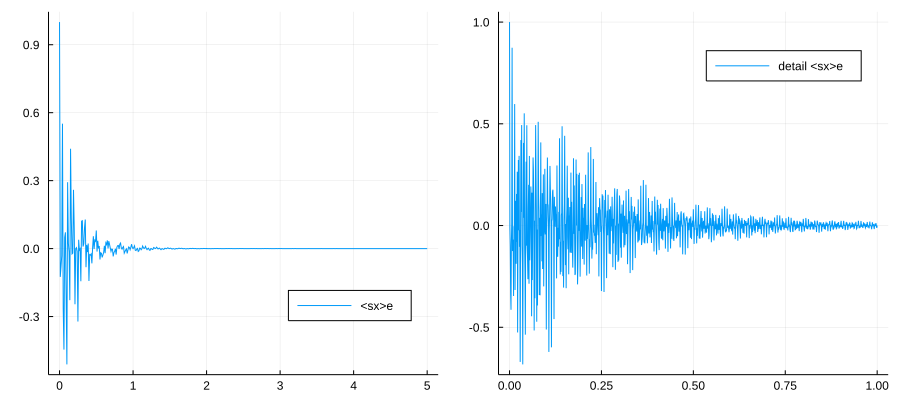

In [234]:
# time evolution of the expectation value of sx for the electron
Sx_t = real(expect(sx ⊗ one(bp), ρt))
Sz_t = real(expect(sz ⊗ one(bp), ρt))

# some plots
plt_full = plot(T[1:100:end], Sx_t[1:100:end], labels = "<sx>e", legend = :bottomright)

T_win_start = 137.5;
T_win_step = 10;
T_win_rng = 10000;
T_win_start_index = indexin(T_win_start, T)[1]
T_win_start_index = T_win_start_index == nothing ? 1 : T_win_start_index
T_win = T_win_start_index:T_win_step:(T_win_start_index + T_win_rng)

plt_detail = plot(T[T_win], Sx_t[T_win], labels = "detail <sx>e")

plot(plt_full, plt_detail, size =(900, 400), layout = @layout [a b])

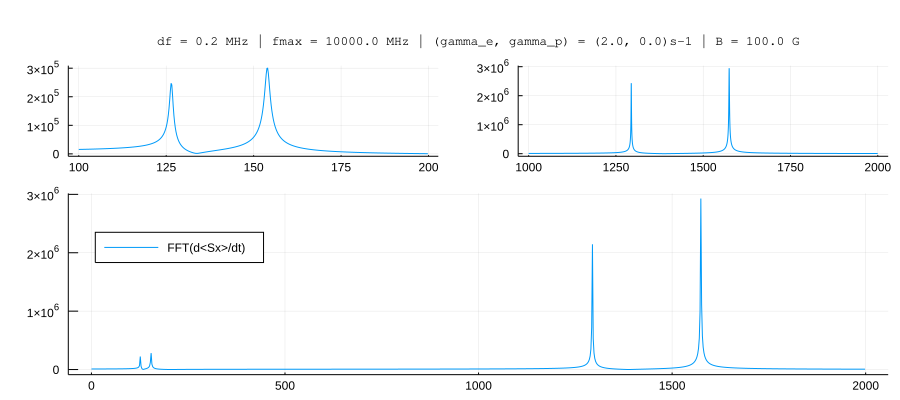

In [235]:
# Fourier
dt = T[2] - T[1]  # time increment
fmax = 1/dt       # max sampled frequency = 1/sampling rate (Note: FFT is mirrored beyond fmax/2)
df = 1/(T[end] - T[1])   # frequency increment = 1/(measurement time)
frng = LinRange(0, fmax, length(T)-1)  # available frequency range (-1 because of the derivative | see below)

# Time derivative of the Sx signal -- that's what the coil sees
dSxdt = [(Sx_t[i+1] - Sx_t[i])/dt for i in 1:length(T)-1];
dSzdt = [(Sx_t[i+1] - Sz_t[i])/dt for i in 1:length(T)-1];

# Fourier
FT_dSxdt = fft(dSxdt)
FT_dSzdt = fft(dSzdt)

f_start = 100
f_step = 1
f_end = 200
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

plotlow = plot(f_part[:,1], f_part[:,2], legend = :false, titlefontsize = 9)


f_start = 1000
f_step = 1
f_end = 2000
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

plothi = plot(f_part[:,1], f_part[:,2], titlefontsize = 9, legend = false)


f_start = 0
f_step = 10
f_end = 2000
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

plotall = plot(f_part[:,1], f_part[:,2], label = "FFT(d<Sx>/dt)", legend = :topleft, titlefontsize = 9)

tit = scatter([1,1,1], marker=0,markeralpha=0, annotations=(2, 1, text("df = $df MHz | fmax = $fmax MHz | (gamma_e, gamma_p) = ($γe, $γp)s-1 | B = $(B*10000) G", 7, "Courier")),axis=false, ticks = false, leg=false,size=(200,20))
plot(tit, plotlow, plothi, plotall, size = (900,400), layout = @layout [a{0.1h} ; b c; d{0.6h}])

## Master eq for deuterium

In [321]:
# bases
be = SpinBasis(1//2)
bd = SpinBasis(1)
bD = be ⊗ bd

# spin-½ and spin-1 σ-matrices
sx = sigmax(be)
sy = sigmay(be)
sz = sigmaz(be)

sxd = sigmax(bd)
syd = sigmay(bd)
szd = sigmaz(bd)

# Some constants (this is still a numerical package)
ωe = 0.;
ωd = 0.;
A = 342.83; # this is A/ħ (in MHz) = ⅙ × 2π × f_HF, since ω_HF = 6 × A/ħ in deuterium, and f_HF = 327.38MHz
μe = 88093.0; # 10⁶ × μe/ħ  (electron magnetic moment divided by ħ | units: MHz/T)
μd = 0.0;  # get rid of nuclear magnetic moment to lighten calculations
B = 0.02005;  # Magnetic field in Tesla
γe = 1.0   # electron spin dephasing rate
γd = 0.0   #  nuclear spin dephasing rate

# Hamiltonian
Hspin(ω, σ) = ω*σ/2
HoD = Hspin(ωe, sz)⊗one(bd) + one(be)⊗Hspin(ωd, szd) # Rest energy Hamiltonian -- ignore (via ωe = ωd = 0)

HintD = A*(sx⊗sxd + sy⊗syd + sz⊗szd) # I⋅S interaction Hamiltonian

HBD = -(μe*sz⊗one(bd) + μd*one(be)⊗szd) * B  # Magnetic Hamiltonian -- assume B || z

HD = HoD + HintD + HBD  # Total Hamiltonian

# wavefunctions and density matrices for <s>e || x
ψp = 1/√2 * (spinup(be) + spindown(be))⊗spinup(bd) # |e:↑>ₓ⊗ |d:↑>ₓ
ψ0 = 1/√2 * (spinup(be) + spindown(be))⊗Ket(bd, [0,1,0])   # |e:↑>ₓ⊗ |d:0>ₓ
ψm = 1/√2 * (spinup(be) + spindown(be))⊗spindown(bd)   # |e:↑>ₓ⊗ |d:↓>ₓ

# wavefunctions and density matrices for <s>e || z
# ψp = spinup(be)⊗spinup(bd) # |e:↑>ₓ⊗ |d:↑>ₓ
# ψ0 = spinup(be)⊗Ket(bd, [0,1,0])   # |e:↑>ₓ⊗ |d:0>ₓ
# ψm = spinup(be)⊗spindown(bd)   # |e:↑>ₓ⊗ |d:↓>ₓ

ρo = (dm(ψp) + dm(ψ0) + dm(ψm))/3  # density matrix |e:↑>ₓ<e:↑|ₓ ⊗ (|d:↑><d:↑| + |d:0><d:0| + |d:↓><d:↓|)

# Jump operators for the master equation
# Js = [one(be)⊗one(bd)];  # assume no non-identity jump operators (no decay etc.)
Js = [γe*sz⊗one(bd), γd*one(be)⊗szd]; # pure dephasing

In [333]:
# time range and master eq time evolution
T = [0:0.0001:10;]  # this is in μs presumably | caution: 0:0.001:1000 is one million points!

@time tout, ρt = timeevolution.master(T, ρo, HD, Js#==# ; maxiters = 1E8#==#);  # resulting density matrix is ρt

  1.030645 seconds (3.00 M allocations: 232.908 MiB)


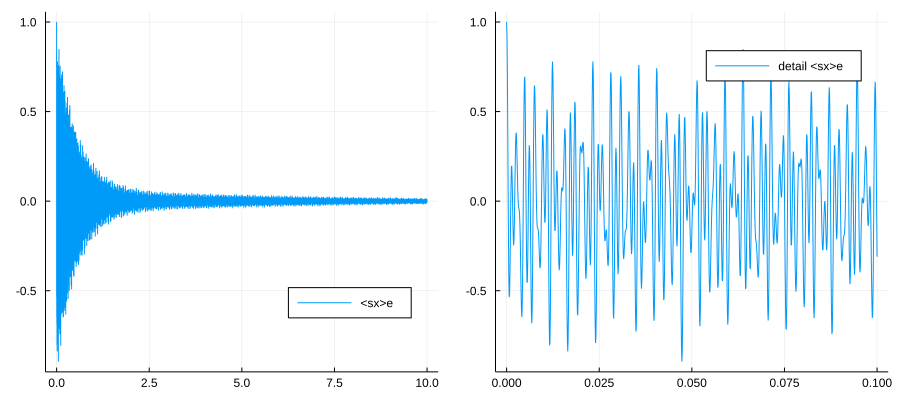

In [323]:
# time evolution of the expectation value of sx for the electron
Sx_t = real(expect(sx ⊗ one(bd), ρt))
Sz_t = real(expect(sz ⊗ one(bd), ρt))

# some plots
plt_full = plot(T[1:1:end], Sx_t[1:1:end], labels = "<sx>e", legend = :bottomright)

T_win_start = 25;
T_win_step = 1;
T_win_rng = 1000;
T_win_start_index = indexin(T_win_start, T)[1]
T_win_start_index = T_win_start_index == nothing ? 1 : T_win_start_index
T_win = T_win_start_index:T_win_step:(T_win_start_index + T_win_rng)

plt_detail = plot(T[T_win], Sx_t[T_win], labels = "detail <sx>e")

plot(plt_full, plt_detail, size =(900, 400), layout = @layout [a b])

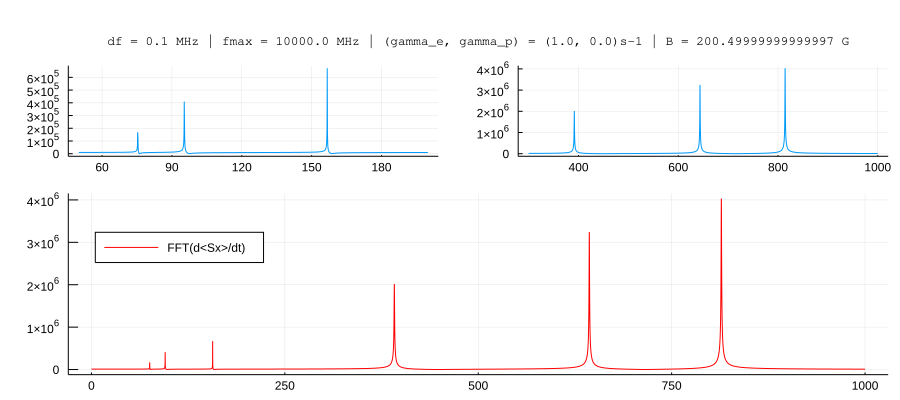

In [324]:
# Fourier
dt = T[2] - T[1]  # time increment
fmax = 1/dt       # max sampled frequency = 1/sampling rate (Note: FFT is mirrored beyond fmax/2)
df = 1/(T[end] - T[1])   # frequency increment = 1/(measurement time)
frng = LinRange(0, fmax, length(T)-2)  # available frequency range (-1 because of the derivative | see below)

# Time derivative of the Sx signal -- that's what the coil sees
dSxdt = [(Sx_t[i+1] - Sx_t[i-1])/(2dt) for i in 2:length(T)-1];
dSzdt = [(Sz_t[i+1] - Sz_t[i-1])/(2dt) for i in 2:length(T)-1];

# Fourier
FT_dSxdt = fft(dSxdt)
FT_dSzdt = fft(dSzdt)

f_start = 50
f_step = 1
f_end = 200
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

plotlow = plot(f_part[:,1], f_part[:,2], legend = :false, titlefontsize = 9)


f_start = 300
f_step = 1
f_end = 1000
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

plothi = plot(f_part[:,1], f_part[:,2], legend = false, titlefontsize = 9)


f_start = 0
f_step = 1
f_end = 1000
filter_f = hcat(frng, abs.(FT_dSxdt))
filter_f = filter_f[(filter_f[:,1] .< f_end) .& (filter_f[:,1] .> f_start), :]
f_part = filter_f[1:f_step:end, :]

ls200_5 = f_part[:,2]
plotall = plot(f_part[:,1], f_part[:,2], linecolor=:red, legend = :topleft, label = "FFT(d<Sx>/dt)", titlefontsize = 9)

tit = scatter([1,1,1], marker=0,markeralpha=0, annotations=(2, 1, text("df = $df MHz | fmax = $fmax MHz | (gamma_e, gamma_p) = ($γe, $γp)s-1 | B = $(B*10000) G", 7, "Courier")),axis=false, ticks = false, leg=false,size=(200,20))
plot(tit, plotlow, plothi, plotall, size = (900,400), layout = @layout [a{0.1h} ; b c; d{0.6h}])


#display(plot(frng[f_plotrange], abs.(FT_dSzdt[f_plotrange]), label = "FFT(d<Sz>/dt)", title = "df = $df MHz | fmax = $fmax MHz | B = $(B*10000) G", titlefontsize = 9))

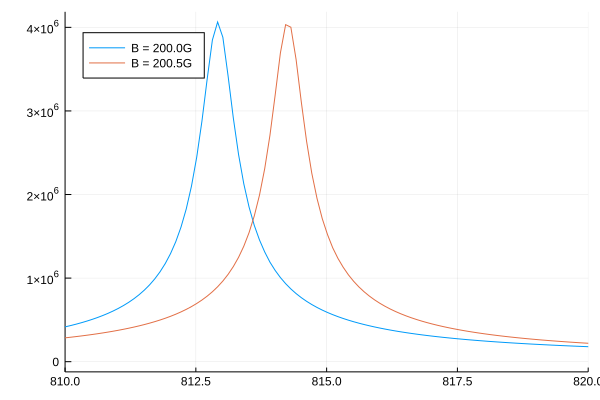

In [330]:
compplot = plot(f_part[:,1], [ls200, ls200_5],label = ["B = 200.0G" "B = 200.5G"],legend=:topleft)
xaxis!(compplot, (810,820))

In [328]:
maximum(ls200)/maximum(ls200_5)

1.007837276256259

In [329]:
length(ls200)

9999